In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/imagenet/imagenet/"
x = load(os.path.join(path, 'train/ILSVRC2012_val_00005002.JPEG'))
print(x.shape)

(409, 500, 3)


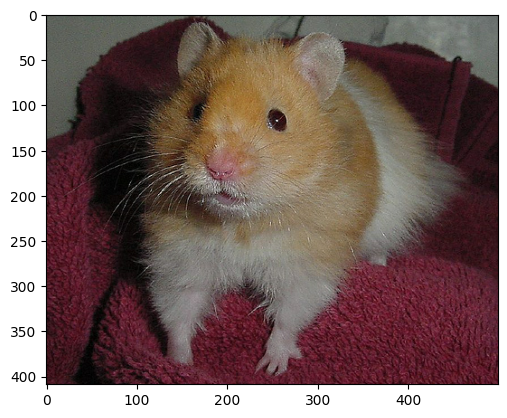

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

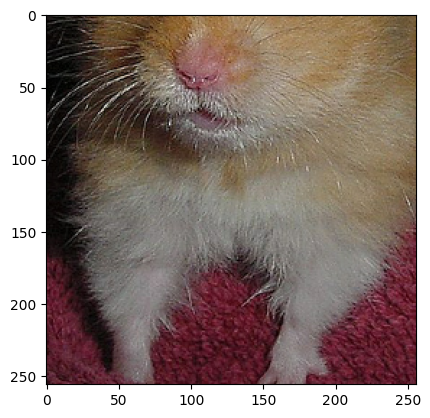

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

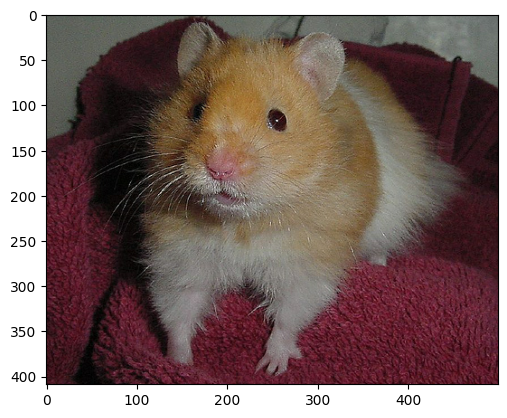

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

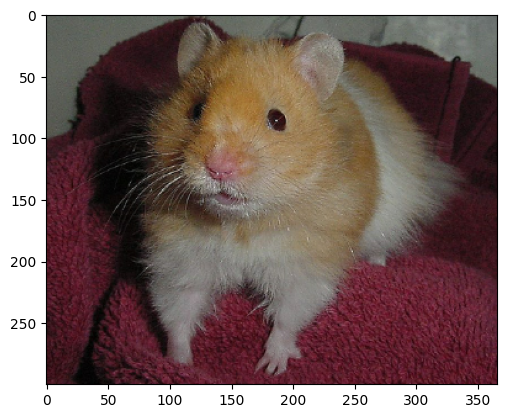

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.JPEG")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

500

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "val/*.JPEG")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 205, 250, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 410, 500, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

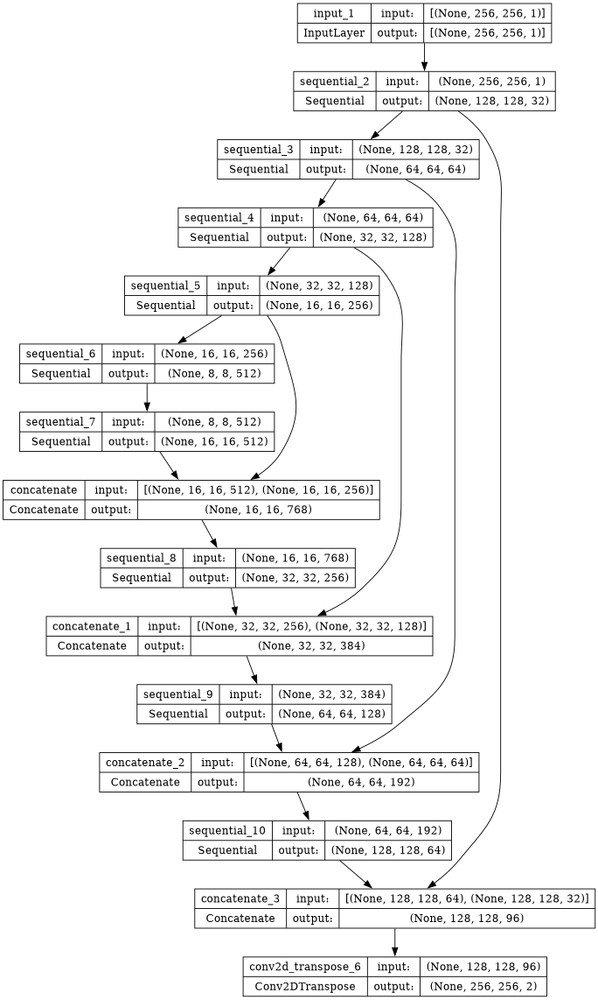

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
# gen.load_weights('/kaggle/input/imagenetmodelweights/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

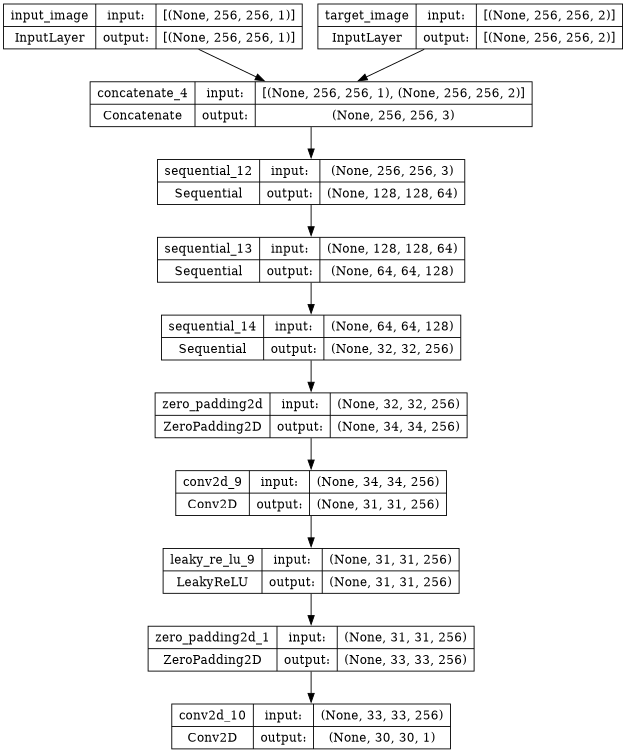

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
# disc.load_weights('/kaggle/input/imagenetmodelweights/disc_weight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 150

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values,psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


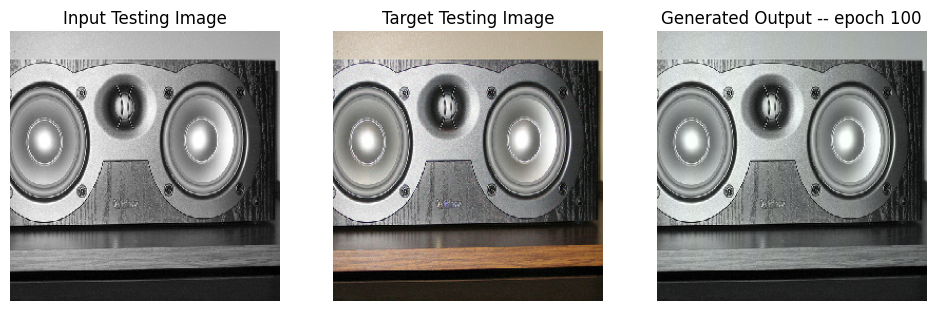

SSIM Score: 0.9487871527671814
PSNR Score: 26.759321212768555


In [47]:
display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000109.JPEG',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000109.JPEG', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 2s 0us/step
Training Details
Generator-- total_loss:11.19993 gan_loss:1.69713 l1_loss:0.05227 perceptual_loss:0.01109 Discriminator-- total_loss:1.09754 real_loss:0.54517 generated_loss:0.55236 --- SSIM 0.82553 PSNR 21.66540 LPIPS 0.00000
Time taken for epoch 1 is 603.2268204689026 sec
Number of iteration 500
Validation Details
Generator-- total_loss:9.66984 gan_loss:0.70920 l1_loss:0.04821  perceptual_loss:0.01152 Discriminator-- total_loss:1.32508 real_loss:0.79547 generated_loss:0.52961 --- SSIM 0.89710 PSNR 22.81905 LPIPS 0.00000
Time taken for epoch 1 is 645.8897655010223 sec
Number of iteration 63
Displaying one random test image...


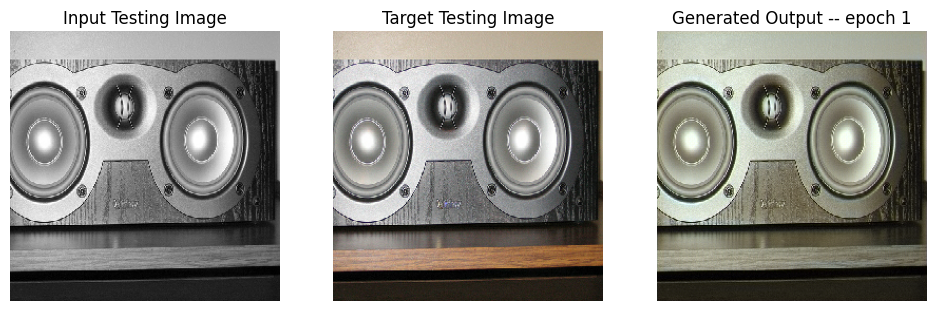

SSIM Score: 0.9415175318717957
PSNR Score: 27.20235824584961
Epoch 1
Training Details
Generator-- total_loss:11.13571 gan_loss:1.71089 l1_loss:0.05275 perceptual_loss:0.01008 Discriminator-- total_loss:1.06771 real_loss:0.52450 generated_loss:0.54321 --- SSIM 0.86351 PSNR 21.43073 LPIPS 0.00000
Time taken for epoch 2 is 587.8780362606049 sec
Number of iteration 500
Validation Details
Generator-- total_loss:12.02888 gan_loss:1.42830 l1_loss:0.05884  perceptual_loss:0.01183 Discriminator-- total_loss:1.51834 real_loss:0.43380 generated_loss:1.08454 --- SSIM 0.87452 PSNR 20.44464 LPIPS 0.00000
Time taken for epoch 2 is 629.0497777462006 sec
Number of iteration 63
Epoch 2
Training Details
Generator-- total_loss:11.03911 gan_loss:1.52368 l1_loss:0.05329 perceptual_loss:0.01015 Discriminator-- total_loss:1.08642 real_loss:0.52989 generated_loss:0.55652 --- SSIM 0.87307 PSNR 21.11353 LPIPS 0.00000
Time taken for epoch 3 is 587.8138337135315 sec
Number of iteration 500
Validation Details
Gener

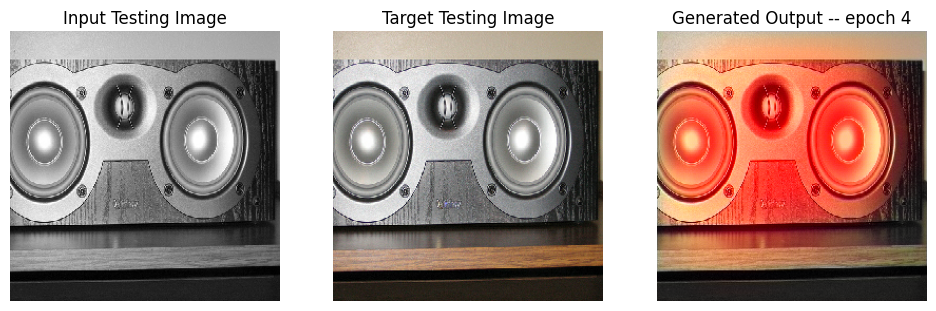

SSIM Score: 0.7989184856414795
PSNR Score: 11.462637901306152
Epoch 4
Training Details
Generator-- total_loss:10.61167 gan_loss:1.41179 l1_loss:0.05176 perceptual_loss:0.00957 Discriminator-- total_loss:1.15924 real_loss:0.56397 generated_loss:0.59527 --- SSIM 0.88591 PSNR 21.48304 LPIPS 0.00000
Time taken for epoch 5 is 589.1714105606079 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.18756 gan_loss:0.48709 l1_loss:0.08556  perceptual_loss:0.01245 Discriminator-- total_loss:1.76758 real_loss:1.41047 generated_loss:0.35710 --- SSIM 0.83243 PSNR 18.31210 LPIPS 0.00000
Time taken for epoch 5 is 628.9412536621094 sec
Number of iteration 63
Epoch 5
Training Details
Generator-- total_loss:10.65804 gan_loss:1.31221 l1_loss:0.05275 perceptual_loss:0.00956 Discriminator-- total_loss:1.15149 real_loss:0.55088 generated_loss:0.60061 --- SSIM 0.88555 PSNR 21.30547 LPIPS 0.00000
Time taken for epoch 6 is 588.5131759643555 sec
Number of iteration 500
Validation Details
Gene

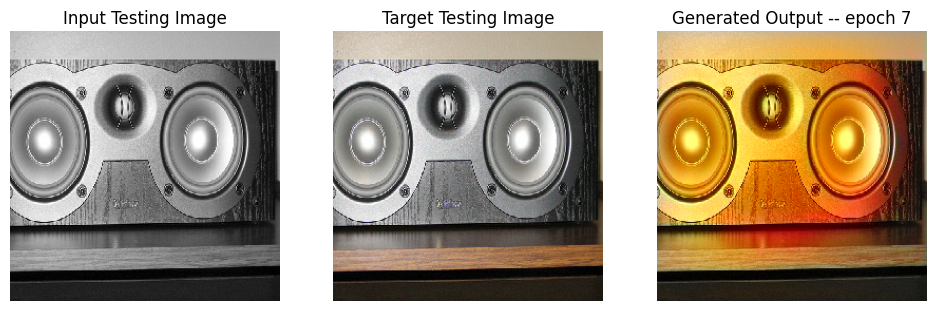

SSIM Score: 0.7287152409553528
PSNR Score: 12.194847106933594
Epoch 7
Training Details
Generator-- total_loss:10.45776 gan_loss:1.32957 l1_loss:0.05139 perceptual_loss:0.00947 Discriminator-- total_loss:1.16379 real_loss:0.55629 generated_loss:0.60750 --- SSIM 0.89101 PSNR 21.47379 LPIPS 0.00000
Time taken for epoch 8 is 587.5249552726746 sec
Number of iteration 500
Validation Details
Generator-- total_loss:12.38616 gan_loss:0.38352 l1_loss:0.06894  perceptual_loss:0.01108 Discriminator-- total_loss:1.71488 real_loss:1.27186 generated_loss:0.44302 --- SSIM 0.88273 PSNR 20.01245 LPIPS 0.00000
Time taken for epoch 8 is 627.1958978176117 sec
Number of iteration 63
Epoch 8
Training Details
Generator-- total_loss:10.64252 gan_loss:1.32036 l1_loss:0.05235 perceptual_loss:0.00979 Discriminator-- total_loss:1.11360 real_loss:0.52100 generated_loss:0.59260 --- SSIM 0.88424 PSNR 21.32560 LPIPS 0.00000
Time taken for epoch 9 is 588.2223749160767 sec
Number of iteration 500
Validation Details
Gene

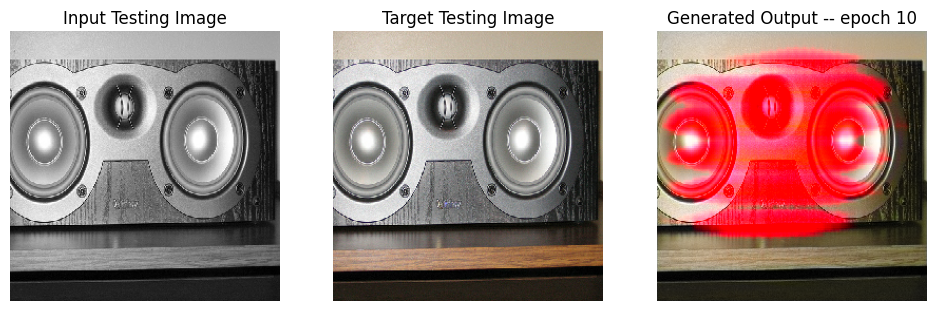

SSIM Score: 0.6128273010253906
PSNR Score: 7.307448387145996
Epoch 10
Training Details
Generator-- total_loss:9.02598 gan_loss:0.51272 l1_loss:0.04701 perceptual_loss:0.00974 Discriminator-- total_loss:1.54600 real_loss:1.17706 generated_loss:0.36893 --- SSIM 0.90274 PSNR 21.49287 LPIPS 0.00000
Time taken for epoch 11 is 531.3406364917755 sec
Number of iteration 500
Validation Details
Generator-- total_loss:14.83791 gan_loss:0.31306 l1_loss:0.08169  perceptual_loss:0.01514 Discriminator-- total_loss:2.42384 real_loss:2.12828 generated_loss:0.29556 --- SSIM 0.84548 PSNR 15.87920 LPIPS 0.00000
Time taken for epoch 11 is 571.6057069301605 sec
Number of iteration 63
Epoch 11
Training Details
Generator-- total_loss:16.79068 gan_loss:8.34029 l1_loss:0.04641 perceptual_loss:0.00992 Discriminator-- total_loss:0.01905 real_loss:0.00894 generated_loss:0.01012 --- SSIM 0.90438 PSNR 21.19280 LPIPS 0.00000
Time taken for epoch 12 is 394.64439630508423 sec
Number of iteration 500
Validation Details


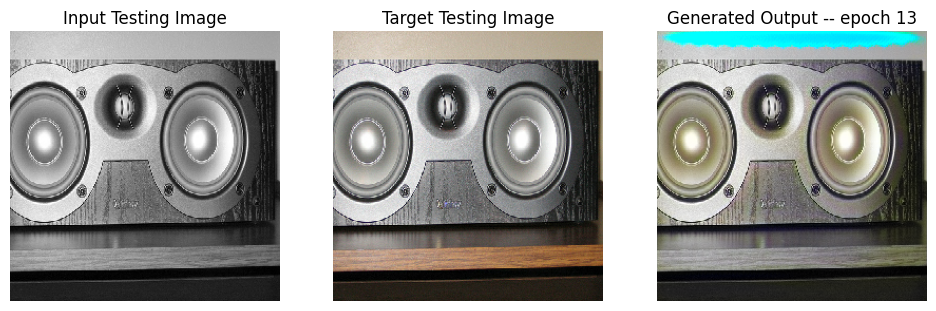

SSIM Score: 0.9001728892326355
PSNR Score: 12.273567199707031
Epoch 13
Training Details
Generator-- total_loss:19.54242 gan_loss:11.15396 l1_loss:0.04607 perceptual_loss:0.00985 Discriminator-- total_loss:0.20861 real_loss:0.09289 generated_loss:0.11572 --- SSIM 0.90460 PSNR 21.26725 LPIPS 0.00000
Time taken for epoch 14 is 392.34394884109497 sec
Number of iteration 500
Validation Details
Generator-- total_loss:13.64652 gan_loss:3.10671 l1_loss:0.05834  perceptual_loss:0.01193 Discriminator-- total_loss:2.91990 real_loss:2.42548 generated_loss:0.49442 --- SSIM 0.89109 PSNR 19.16273 LPIPS 0.00000
Time taken for epoch 14 is 432.1873104572296 sec
Number of iteration 63
Epoch 14
Training Details
Generator-- total_loss:19.74093 gan_loss:11.26542 l1_loss:0.04652 perceptual_loss:0.00998 Discriminator-- total_loss:0.00220 real_loss:0.00157 generated_loss:0.00062 --- SSIM 0.90430 PSNR 21.21176 LPIPS 0.00000
Time taken for epoch 15 is 392.9885473251343 sec
Number of iteration 500
Validation Deta

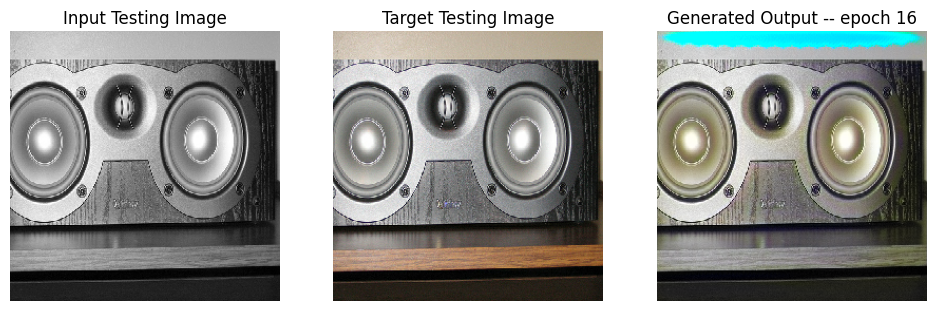

SSIM Score: 0.8995868563652039
PSNR Score: 12.106791496276855
Epoch 16
Training Details
Generator-- total_loss:19.69773 gan_loss:11.23032 l1_loss:0.04662 perceptual_loss:0.00983 Discriminator-- total_loss:0.00603 real_loss:0.00213 generated_loss:0.00390 --- SSIM 0.90359 PSNR 21.21748 LPIPS 0.00000
Time taken for epoch 17 is 393.06373715400696 sec
Number of iteration 500
Validation Details
Generator-- total_loss:10.99636 gan_loss:0.76825 l1_loss:0.05638  perceptual_loss:0.01181 Discriminator-- total_loss:3.23090 real_loss:2.97625 generated_loss:0.25465 --- SSIM 0.89433 PSNR 19.34390 LPIPS 0.00000
Time taken for epoch 17 is 432.75292921066284 sec
Number of iteration 63
Epoch 17
Training Details
Generator-- total_loss:20.21130 gan_loss:11.70384 l1_loss:0.04682 perceptual_loss:0.00990 Discriminator-- total_loss:0.00033 real_loss:0.00012 generated_loss:0.00022 --- SSIM 0.90366 PSNR 21.21432 LPIPS 0.00000
Time taken for epoch 18 is 391.42430567741394 sec
Number of iteration 500
Validation De

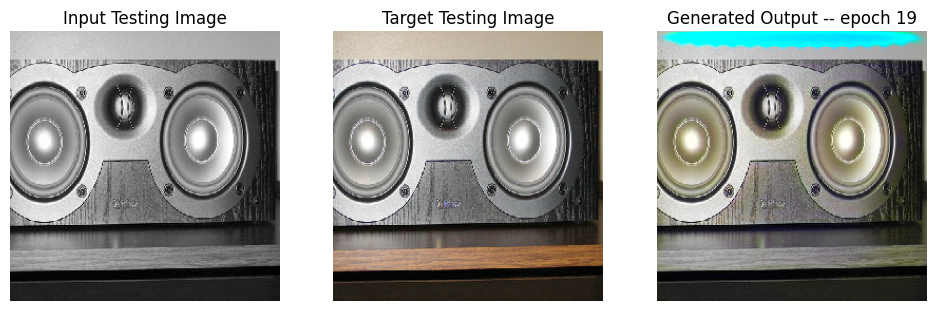

SSIM Score: 0.9002302289009094
PSNR Score: 12.267115592956543
Epoch 19
Training Details
Generator-- total_loss:22.54140 gan_loss:14.02392 l1_loss:0.04684 perceptual_loss:0.00995 Discriminator-- total_loss:0.16089 real_loss:0.07449 generated_loss:0.08640 --- SSIM 0.90403 PSNR 21.17759 LPIPS 0.00000
Time taken for epoch 20 is 391.8112075328827 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.40124 gan_loss:1.15556 l1_loss:0.05668  perceptual_loss:0.01162 Discriminator-- total_loss:16.36477 real_loss:16.09572 generated_loss:0.26906 --- SSIM 0.89483 PSNR 19.51879 LPIPS 0.00000
Time taken for epoch 20 is 431.96529364585876 sec
Number of iteration 63
Epoch 20
Training Details
Generator-- total_loss:23.12955 gan_loss:14.69011 l1_loss:0.04635 perceptual_loss:0.00992 Discriminator-- total_loss:0.00012 real_loss:0.00006 generated_loss:0.00006 --- SSIM 0.90479 PSNR 21.21489 LPIPS 0.00000
Time taken for epoch 21 is 393.26196479797363 sec
Number of iteration 500
Validation D

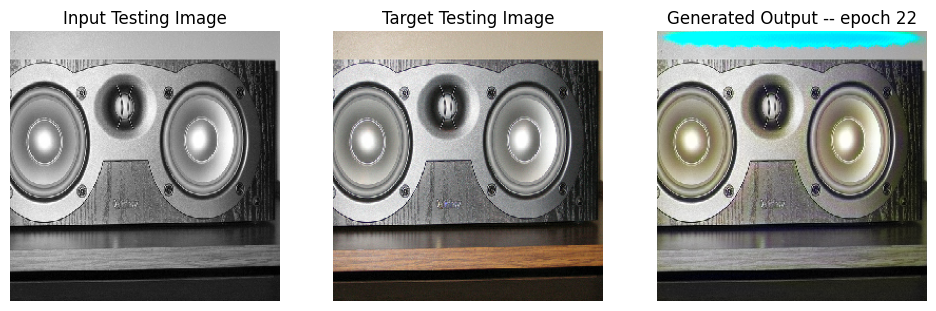

SSIM Score: 0.8999264240264893
PSNR Score: 12.19939136505127
Epoch 22
Training Details
Generator-- total_loss:45.00784 gan_loss:36.54088 l1_loss:0.04658 perceptual_loss:0.00987 Discriminator-- total_loss:0.00052 real_loss:0.00045 generated_loss:0.00008 --- SSIM 0.90381 PSNR 21.23013 LPIPS 0.00000
Time taken for epoch 23 is 393.67651319503784 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.81115 gan_loss:5.15831 l1_loss:0.05867  perceptual_loss:0.01235 Discriminator-- total_loss:31.65685 real_loss:30.37408 generated_loss:1.28276 --- SSIM 0.88946 PSNR 18.85001 LPIPS 0.00000
Time taken for epoch 23 is 433.5009686946869 sec
Number of iteration 63
Epoch 23
Training Details
Generator-- total_loss:44.95207 gan_loss:36.47839 l1_loss:0.04649 perceptual_loss:0.01000 Discriminator-- total_loss:0.00103 real_loss:0.00095 generated_loss:0.00008 --- SSIM 0.90358 PSNR 21.18991 LPIPS 0.00000
Time taken for epoch 24 is 391.54137539863586 sec
Number of iteration 500
Validation De

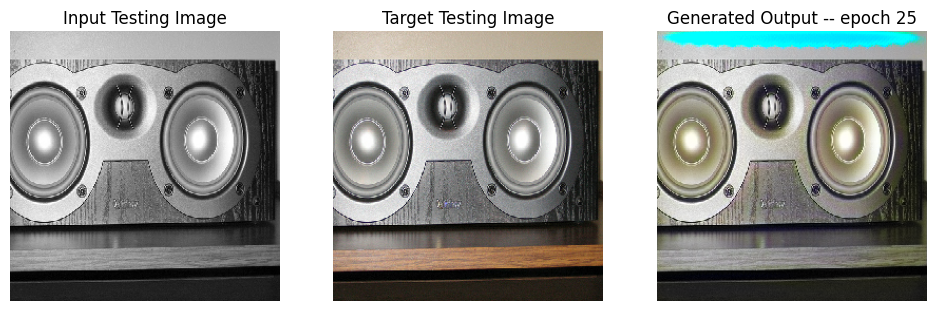

SSIM Score: 0.9002947807312012
PSNR Score: 12.298792839050293
Epoch 25
Training Details
Generator-- total_loss:36.17702 gan_loss:27.78953 l1_loss:0.04611 perceptual_loss:0.00981 Discriminator-- total_loss:0.07082 real_loss:0.03501 generated_loss:0.03580 --- SSIM 0.90531 PSNR 21.27438 LPIPS 0.00000
Time taken for epoch 26 is 397.18785881996155 sec
Number of iteration 500
Validation Details
Generator-- total_loss:13.18241 gan_loss:2.96343 l1_loss:0.05639  perceptual_loss:0.01173 Discriminator-- total_loss:46.66684 real_loss:46.65263 generated_loss:0.01421 --- SSIM 0.89471 PSNR 19.37479 LPIPS 0.00000
Time taken for epoch 26 is 437.7937958240509 sec
Number of iteration 63
Epoch 26
Training Details
Generator-- total_loss:31.58203 gan_loss:23.22317 l1_loss:0.04592 perceptual_loss:0.00981 Discriminator-- total_loss:0.00217 real_loss:0.00122 generated_loss:0.00095 --- SSIM 0.90545 PSNR 21.29406 LPIPS 0.00000
Time taken for epoch 27 is 401.09099769592285 sec
Number of iteration 500
Validation D

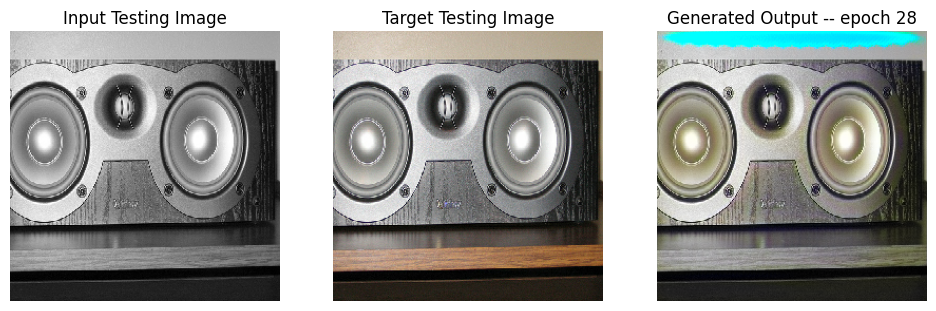

SSIM Score: 0.9001340270042419
PSNR Score: 12.21312427520752
Epoch 28
Training Details
Generator-- total_loss:43.03419 gan_loss:34.56234 l1_loss:0.04657 perceptual_loss:0.00991 Discriminator-- total_loss:0.00146 real_loss:0.00118 generated_loss:0.00028 --- SSIM 0.90421 PSNR 21.21610 LPIPS 0.00000
Time taken for epoch 29 is 397.28874349594116 sec
Number of iteration 500
Validation Details
Generator-- total_loss:19.08320 gan_loss:8.66081 l1_loss:0.05762  perceptual_loss:0.01186 Discriminator-- total_loss:65.21482 real_loss:65.17062 generated_loss:0.04421 --- SSIM 0.89381 PSNR 19.13630 LPIPS 0.00000
Time taken for epoch 29 is 437.79832768440247 sec
Number of iteration 63
Epoch 29
Training Details
Generator-- total_loss:45.96783 gan_loss:37.48843 l1_loss:0.04654 perceptual_loss:0.00999 Discriminator-- total_loss:0.00816 real_loss:0.00780 generated_loss:0.00036 --- SSIM 0.90408 PSNR 21.22300 LPIPS 0.00000
Time taken for epoch 30 is 395.69723439216614 sec
Number of iteration 500
Validation D

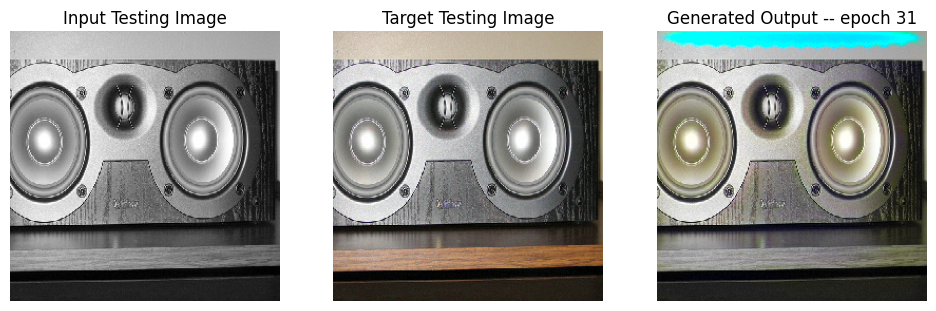

SSIM Score: 0.9005904793739319
PSNR Score: 12.362308502197266
Epoch 31
Training Details
Generator-- total_loss:57.55684 gan_loss:49.04691 l1_loss:0.04673 perceptual_loss:0.01000 Discriminator-- total_loss:0.03809 real_loss:0.03383 generated_loss:0.00426 --- SSIM 0.90402 PSNR 21.19750 LPIPS 0.00000
Time taken for epoch 32 is 395.8908226490021 sec
Number of iteration 500
Validation Details
Generator-- total_loss:17.70809 gan_loss:7.48693 l1_loss:0.05656  perceptual_loss:0.01158 Discriminator-- total_loss:51.30527 real_loss:51.27835 generated_loss:0.02692 --- SSIM 0.89560 PSNR 19.29941 LPIPS 0.00000
Time taken for epoch 32 is 435.9583876132965 sec
Number of iteration 63
Epoch 32
Training Details
Generator-- total_loss:66.77534 gan_loss:58.42018 l1_loss:0.04584 perceptual_loss:0.00986 Discriminator-- total_loss:0.01361 real_loss:0.01333 generated_loss:0.00028 --- SSIM 0.90490 PSNR 21.35381 LPIPS 0.00000
Time taken for epoch 33 is 397.0705146789551 sec
Number of iteration 500
Validation Det

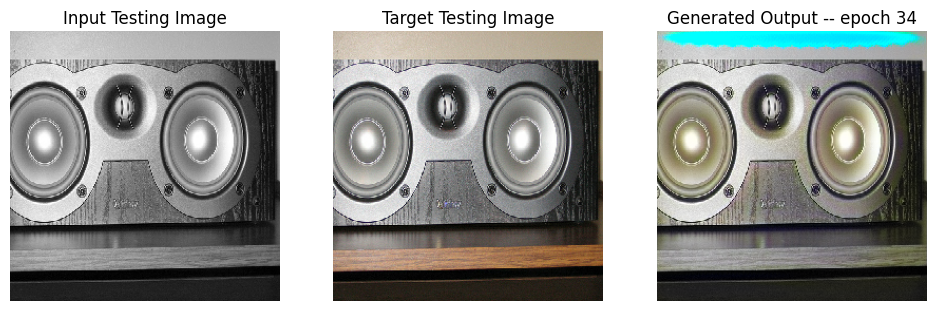

SSIM Score: 0.900242030620575
PSNR Score: 12.283096313476562
Epoch 34
Training Details
Generator-- total_loss:72.75072 gan_loss:64.29021 l1_loss:0.04645 perceptual_loss:0.00996 Discriminator-- total_loss:0.00001 real_loss:0.00000 generated_loss:0.00001 --- SSIM 0.90455 PSNR 21.21510 LPIPS 0.00000
Time taken for epoch 35 is 398.4718677997589 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.20093 gan_loss:4.83011 l1_loss:0.05753  perceptual_loss:0.01161 Discriminator-- total_loss:97.10531 real_loss:87.44607 generated_loss:9.65924 --- SSIM 0.89150 PSNR 19.27232 LPIPS 0.00000
Time taken for epoch 35 is 439.1057949066162 sec
Number of iteration 63
Epoch 35
Training Details
Generator-- total_loss:76.44312 gan_loss:67.96128 l1_loss:0.04662 perceptual_loss:0.00993 Discriminator-- total_loss:0.22351 real_loss:0.14420 generated_loss:0.07931 --- SSIM 0.90401 PSNR 21.20303 LPIPS 0.00000
Time taken for epoch 36 is 395.66044092178345 sec
Number of iteration 500
Validation Det

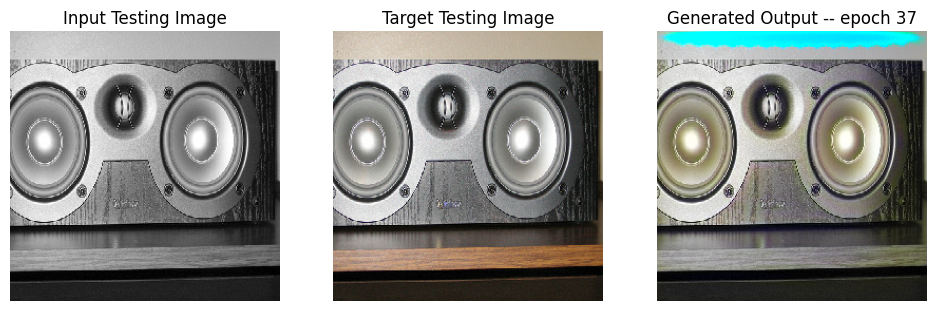

SSIM Score: 0.8996836543083191
PSNR Score: 12.122197151184082
Epoch 37
Training Details
Generator-- total_loss:74.83038 gan_loss:66.40755 l1_loss:0.04634 perceptual_loss:0.00981 Discriminator-- total_loss:0.76583 real_loss:0.37507 generated_loss:0.39076 --- SSIM 0.90459 PSNR 21.24454 LPIPS 0.00000
Time taken for epoch 38 is 395.70569586753845 sec
Number of iteration 500
Validation Details
Generator-- total_loss:20.84423 gan_loss:10.49433 l1_loss:0.05692  perceptual_loss:0.01207 Discriminator-- total_loss:36.87028 real_loss:35.58834 generated_loss:1.28194 --- SSIM 0.89372 PSNR 19.27534 LPIPS 0.00000
Time taken for epoch 38 is 436.5393512248993 sec
Number of iteration 63
Epoch 38
Training Details
Generator-- total_loss:55.76285 gan_loss:47.35281 l1_loss:0.04621 perceptual_loss:0.00986 Discriminator-- total_loss:0.01900 real_loss:0.01672 generated_loss:0.00228 --- SSIM 0.90449 PSNR 21.29064 LPIPS 0.00000
Time taken for epoch 39 is 396.86991930007935 sec
Number of iteration 500
Validation 

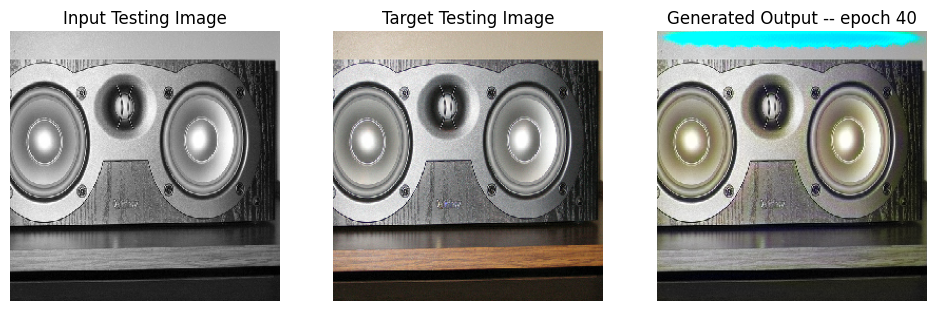

SSIM Score: 0.9001458287239075
PSNR Score: 12.20848560333252
Epoch 40
Training Details
Generator-- total_loss:52.27058 gan_loss:43.82880 l1_loss:0.04641 perceptual_loss:0.00987 Discriminator-- total_loss:0.00330 real_loss:0.00189 generated_loss:0.00141 --- SSIM 0.90406 PSNR 21.23755 LPIPS 0.00000
Time taken for epoch 41 is 396.61391019821167 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.79335 gan_loss:1.33724 l1_loss:0.05756  perceptual_loss:0.01215 Discriminator-- total_loss:70.35121 real_loss:64.53541 generated_loss:5.81580 --- SSIM 0.89404 PSNR 19.06786 LPIPS 0.00000
Time taken for epoch 41 is 437.3566150665283 sec
Number of iteration 63
Epoch 41
Training Details
Generator-- total_loss:50.12911 gan_loss:41.68719 l1_loss:0.04636 perceptual_loss:0.00992 Discriminator-- total_loss:0.00177 real_loss:0.00119 generated_loss:0.00058 --- SSIM 0.90468 PSNR 21.24307 LPIPS 0.00000
Time taken for epoch 42 is 398.50047993659973 sec
Number of iteration 500
Validation De

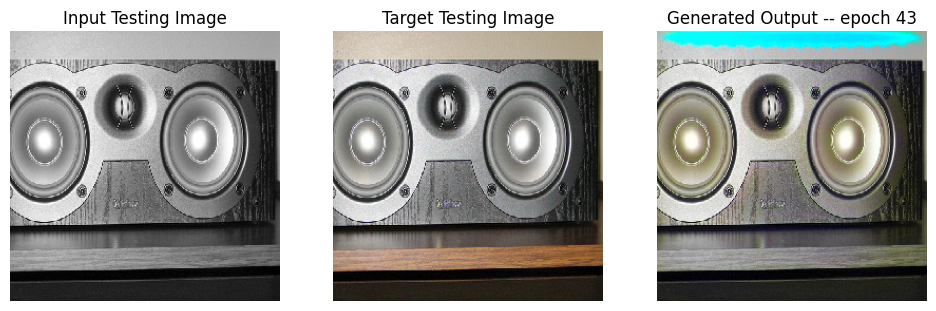

SSIM Score: 0.89952152967453
PSNR Score: 12.0908784866333
Epoch 43
Training Details
Generator-- total_loss:51.37201 gan_loss:42.85352 l1_loss:0.04691 perceptual_loss:0.00988 Discriminator-- total_loss:0.00472 real_loss:0.00421 generated_loss:0.00050 --- SSIM 0.90347 PSNR 21.21301 LPIPS 0.00000
Time taken for epoch 44 is 398.1411123275757 sec
Number of iteration 500
Validation Details
Generator-- total_loss:21.34446 gan_loss:10.85877 l1_loss:0.05802  perceptual_loss:0.01189 Discriminator-- total_loss:11.84954 real_loss:10.41173 generated_loss:1.43782 --- SSIM 0.89123 PSNR 19.24736 LPIPS 0.00000
Time taken for epoch 44 is 438.3201308250427 sec
Number of iteration 63
Epoch 44
Training Details
Generator-- total_loss:50.49469 gan_loss:42.03559 l1_loss:0.04648 perceptual_loss:0.00992 Discriminator-- total_loss:0.00106 real_loss:0.00088 generated_loss:0.00018 --- SSIM 0.90413 PSNR 21.26287 LPIPS 0.00000
Time taken for epoch 45 is 397.75321674346924 sec
Number of iteration 500
Validation Detai

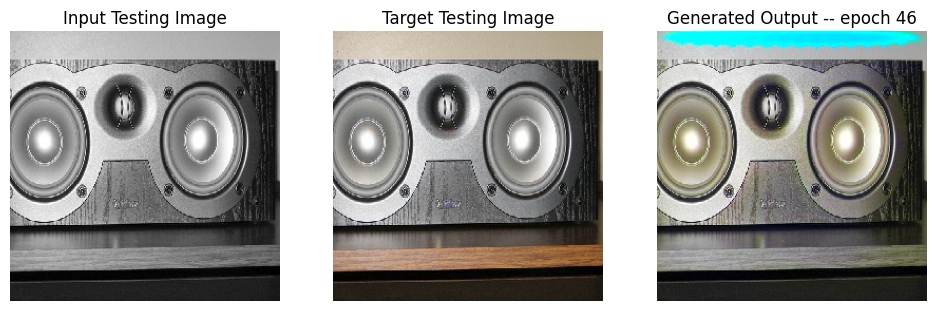

SSIM Score: 0.8999354243278503
PSNR Score: 12.179916381835938
Epoch 46
Training Details
Generator-- total_loss:44.92297 gan_loss:36.45978 l1_loss:0.04650 perceptual_loss:0.00992 Discriminator-- total_loss:0.00134 real_loss:0.00099 generated_loss:0.00035 --- SSIM 0.90431 PSNR 21.24198 LPIPS 0.00000
Time taken for epoch 47 is 399.2960124015808 sec
Number of iteration 500
Validation Details
Generator-- total_loss:22.26590 gan_loss:11.93968 l1_loss:0.05692  perceptual_loss:0.01192 Discriminator-- total_loss:26.26531 real_loss:23.01604 generated_loss:3.24927 --- SSIM 0.89296 PSNR 19.19878 LPIPS 0.00000
Time taken for epoch 47 is 440.2881247997284 sec
Number of iteration 63
Epoch 47
Training Details
Generator-- total_loss:45.69758 gan_loss:37.28193 l1_loss:0.04616 perceptual_loss:0.00994 Discriminator-- total_loss:0.00006 real_loss:0.00005 generated_loss:0.00001 --- SSIM 0.90453 PSNR 21.28320 LPIPS 0.00000
Time taken for epoch 48 is 398.9034070968628 sec
Number of iteration 500
Validation De

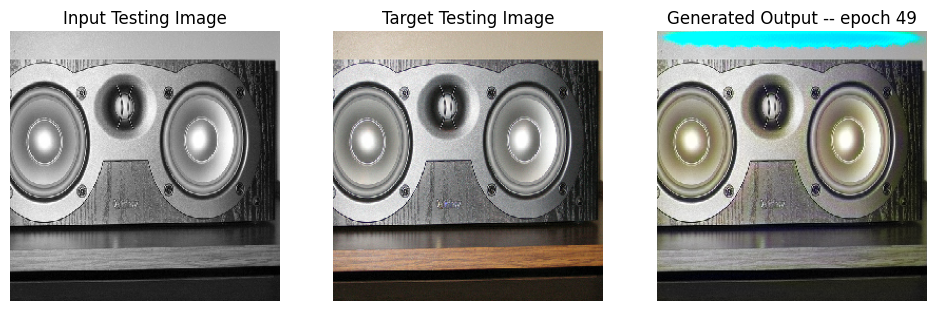

SSIM Score: 0.8995980620384216
PSNR Score: 12.08584976196289
Epoch 49
Training Details
Generator-- total_loss:47.40770 gan_loss:38.93826 l1_loss:0.04656 perceptual_loss:0.00990 Discriminator-- total_loss:0.00009 real_loss:0.00001 generated_loss:0.00007 --- SSIM 0.90390 PSNR 21.25695 LPIPS 0.00000
Time taken for epoch 50 is 394.7484791278839 sec
Number of iteration 500
Validation Details
Generator-- total_loss:15.93049 gan_loss:5.55004 l1_loss:0.05715  perceptual_loss:0.01205 Discriminator-- total_loss:19.82617 real_loss:18.74861 generated_loss:1.07757 --- SSIM 0.89271 PSNR 19.46004 LPIPS 0.00000
Time taken for epoch 50 is 435.6417067050934 sec
Number of iteration 63
Reduced generator learning rate to 0.0004500000213738531 at epoch 50
Epoch 50
Training Details
Generator-- total_loss:7.63997 gan_loss:0.14297 l1_loss:0.04138 perceptual_loss:0.00860 Discriminator-- total_loss:159.62715 real_loss:159.62715 generated_loss:0.00000 --- SSIM 0.91707 PSNR 23.62644 LPIPS 0.00000
Time taken for ep

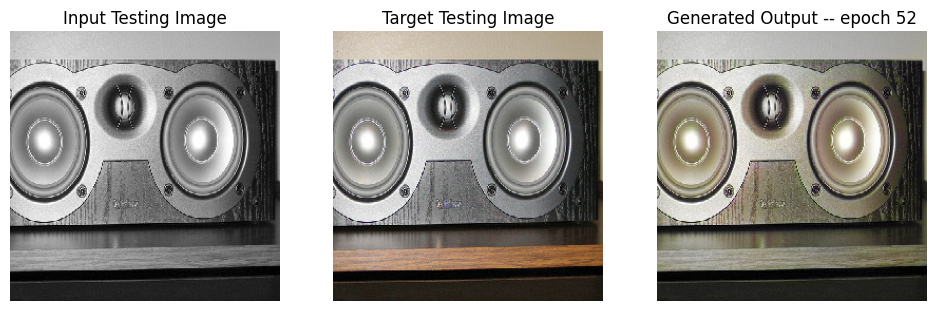

SSIM Score: 0.9483993649482727
PSNR Score: 26.58190155029297
Epoch 52
Training Details
Generator-- total_loss:7.49229 gan_loss:0.00000 l1_loss:0.04144 perceptual_loss:0.00851 Discriminator-- total_loss:162.95206 real_loss:162.95206 generated_loss:0.00000 --- SSIM 0.91825 PSNR 23.67287 LPIPS 0.00000
Time taken for epoch 53 is 532.1313259601593 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.08872 gan_loss:0.00000 l1_loss:0.04457  perceptual_loss:0.00935 Discriminator-- total_loss:124.18158 real_loss:124.18156 generated_loss:0.00001 --- SSIM 0.91692 PSNR 23.51363 LPIPS 0.00000
Time taken for epoch 53 is 572.8184735774994 sec
Number of iteration 63
Epoch 53
Training Details
Generator-- total_loss:7.41214 gan_loss:0.00000 l1_loss:0.04108 perceptual_loss:0.00833 Discriminator-- total_loss:163.81468 real_loss:163.81468 generated_loss:0.00000 --- SSIM 0.91794 PSNR 23.74975 LPIPS 0.00000
Time taken for epoch 54 is 532.5382173061371 sec
Number of iteration 500
Validation

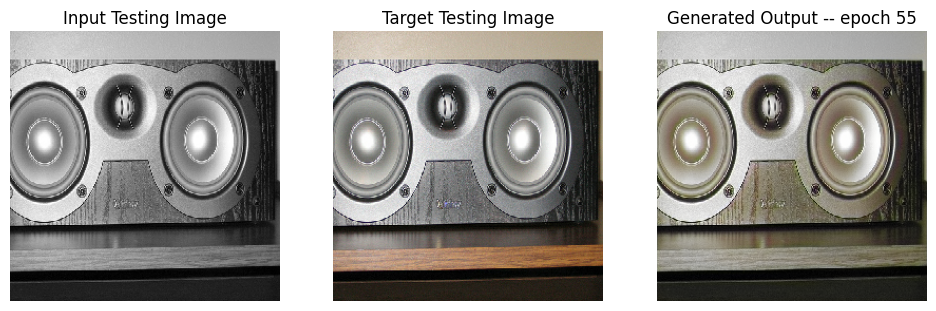

SSIM Score: 0.9492164254188538
PSNR Score: 26.940027236938477
Epoch 55
Training Details
Generator-- total_loss:7.41912 gan_loss:0.00000 l1_loss:0.04105 perceptual_loss:0.00841 Discriminator-- total_loss:161.49341 real_loss:161.49341 generated_loss:0.00000 --- SSIM 0.91817 PSNR 23.71027 LPIPS 0.00000
Time taken for epoch 56 is 532.4337346553802 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.98819 gan_loss:0.00000 l1_loss:0.04996  perceptual_loss:0.00997 Discriminator-- total_loss:115.00906 real_loss:115.00906 generated_loss:0.00000 --- SSIM 0.90895 PSNR 22.44015 LPIPS 0.00000
Time taken for epoch 56 is 573.144743680954 sec
Number of iteration 63
Epoch 56
Training Details
Generator-- total_loss:7.43373 gan_loss:0.00000 l1_loss:0.04122 perceptual_loss:0.00834 Discriminator-- total_loss:161.56831 real_loss:161.56830 generated_loss:0.00000 --- SSIM 0.91867 PSNR 23.71923 LPIPS 0.00000
Time taken for epoch 57 is 529.6165664196014 sec
Number of iteration 500
Validation

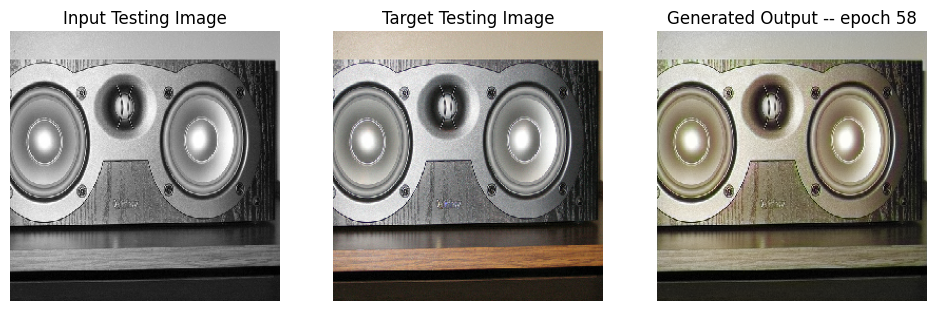

SSIM Score: 0.9463894963264465
PSNR Score: 25.94304084777832
Epoch 58
Training Details
Generator-- total_loss:7.38828 gan_loss:0.00000 l1_loss:0.04089 perceptual_loss:0.00837 Discriminator-- total_loss:162.68506 real_loss:162.68506 generated_loss:0.00000 --- SSIM 0.91888 PSNR 23.74256 LPIPS 0.00000
Time taken for epoch 59 is 531.757474899292 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.16920 gan_loss:0.00000 l1_loss:0.04478  perceptual_loss:0.00968 Discriminator-- total_loss:123.62630 real_loss:123.62630 generated_loss:0.00000 --- SSIM 0.91671 PSNR 23.39236 LPIPS 0.00000
Time taken for epoch 59 is 572.6443345546722 sec
Number of iteration 63
Epoch 59
Training Details
Generator-- total_loss:7.39649 gan_loss:0.00000 l1_loss:0.04101 perceptual_loss:0.00830 Discriminator-- total_loss:163.37321 real_loss:163.37320 generated_loss:0.00002 --- SSIM 0.91965 PSNR 23.72410 LPIPS 0.00000
Time taken for epoch 60 is 532.5991022586823 sec
Number of iteration 500
Validation 

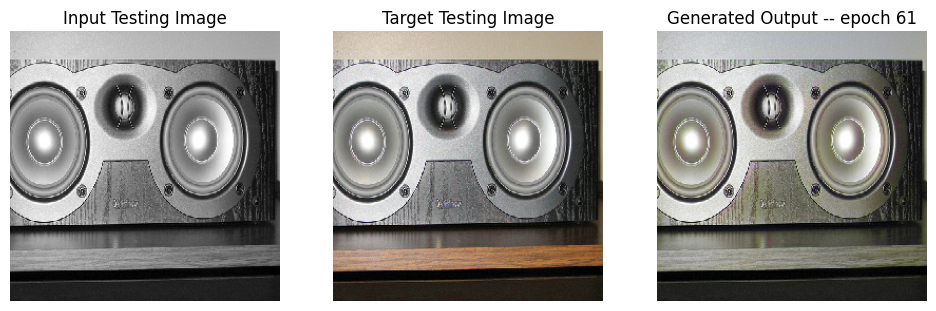

SSIM Score: 0.9498009085655212
PSNR Score: 27.149761199951172
Epoch 61
Training Details
Generator-- total_loss:7.32449 gan_loss:0.00000 l1_loss:0.04052 perceptual_loss:0.00831 Discriminator-- total_loss:162.62917 real_loss:162.62917 generated_loss:0.00000 --- SSIM 0.91958 PSNR 23.81836 LPIPS 0.00000
Time taken for epoch 62 is 533.5567796230316 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.70207 gan_loss:0.00000 l1_loss:0.04852  perceptual_loss:0.00949 Discriminator-- total_loss:116.76579 real_loss:116.76579 generated_loss:0.00000 --- SSIM 0.91302 PSNR 22.70485 LPIPS 0.00000
Time taken for epoch 62 is 573.9283330440521 sec
Number of iteration 63
Epoch 62
Training Details
Generator-- total_loss:7.47527 gan_loss:0.00000 l1_loss:0.04145 perceptual_loss:0.00838 Discriminator-- total_loss:163.41690 real_loss:163.41690 generated_loss:0.00000 --- SSIM 0.91751 PSNR 23.63349 LPIPS 0.00000
Time taken for epoch 63 is 530.269300699234 sec
Number of iteration 500
Validation

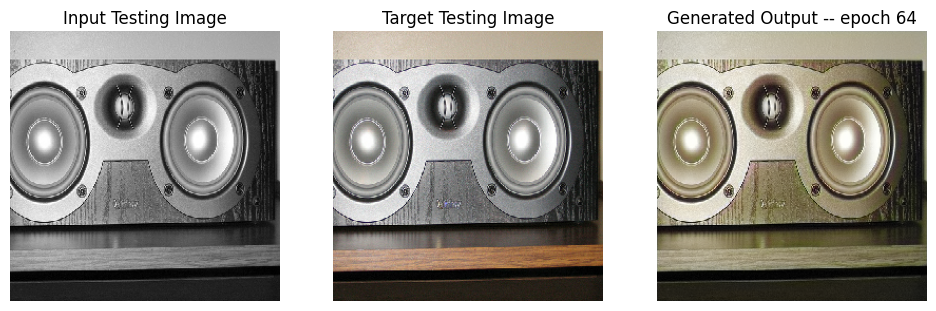

SSIM Score: 0.9453259110450745
PSNR Score: 25.348196029663086
Epoch 64
Training Details
Generator-- total_loss:7.38056 gan_loss:0.00000 l1_loss:0.04089 perceptual_loss:0.00831 Discriminator-- total_loss:162.70747 real_loss:162.70747 generated_loss:0.00002 --- SSIM 0.91938 PSNR 23.75080 LPIPS 0.00000
Time taken for epoch 65 is 534.2885682582855 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.76525 gan_loss:0.00000 l1_loss:0.04880  perceptual_loss:0.00964 Discriminator-- total_loss:117.23895 real_loss:117.23895 generated_loss:0.00000 --- SSIM 0.91071 PSNR 22.64856 LPIPS 0.00000
Time taken for epoch 65 is 574.6346671581268 sec
Number of iteration 63
Epoch 65
Training Details
Generator-- total_loss:7.33465 gan_loss:0.00000 l1_loss:0.04065 perceptual_loss:0.00824 Discriminator-- total_loss:162.65018 real_loss:162.65018 generated_loss:0.00000 --- SSIM 0.91937 PSNR 23.77032 LPIPS 0.00000
Time taken for epoch 66 is 532.0589234828949 sec
Number of iteration 500
Validatio

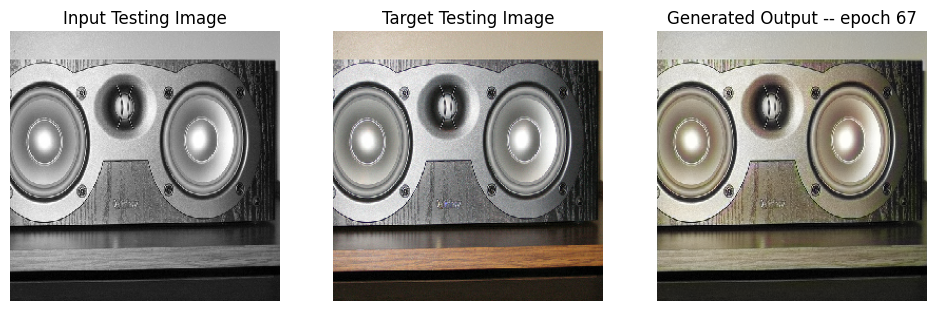

SSIM Score: 0.9498715400695801
PSNR Score: 26.97847557067871
Epoch 67
Training Details
Generator-- total_loss:7.42797 gan_loss:0.00000 l1_loss:0.04132 perceptual_loss:0.00820 Discriminator-- total_loss:162.82738 real_loss:162.82738 generated_loss:0.00000 --- SSIM 0.91864 PSNR 23.72015 LPIPS 0.00000
Time taken for epoch 68 is 532.89723777771 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.18364 gan_loss:0.00000 l1_loss:0.04513  perceptual_loss:0.00942 Discriminator-- total_loss:122.59844 real_loss:122.59844 generated_loss:0.00000 --- SSIM 0.91734 PSNR 23.27749 LPIPS 0.00000
Time taken for epoch 68 is 572.6814465522766 sec
Number of iteration 63
Epoch 68
Training Details
Generator-- total_loss:7.38960 gan_loss:0.00000 l1_loss:0.04102 perceptual_loss:0.00824 Discriminator-- total_loss:161.76503 real_loss:161.76503 generated_loss:0.00000 --- SSIM 0.91865 PSNR 23.77070 LPIPS 0.00000
Time taken for epoch 69 is 532.4476432800293 sec
Number of iteration 500
Validation D

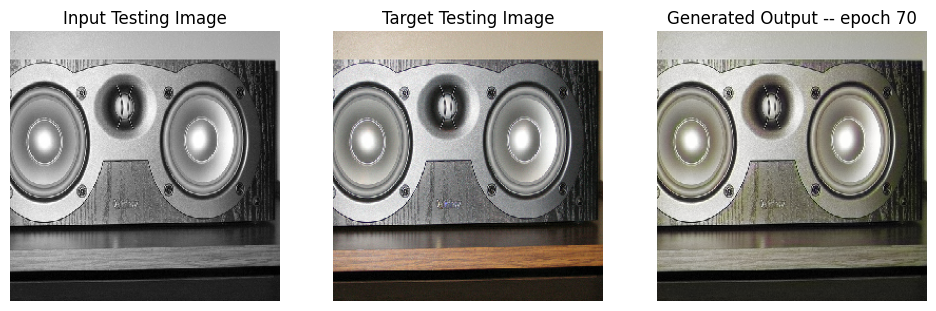

SSIM Score: 0.9522371292114258
PSNR Score: 27.904495239257812
Epoch 70
Training Details
Generator-- total_loss:7.40028 gan_loss:0.00000 l1_loss:0.04117 perceptual_loss:0.00817 Discriminator-- total_loss:164.46135 real_loss:164.46135 generated_loss:0.00000 --- SSIM 0.91812 PSNR 23.73616 LPIPS 0.00000
Time taken for epoch 71 is 532.434556722641 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.31879 gan_loss:0.00000 l1_loss:0.04539  perceptual_loss:0.01007 Discriminator-- total_loss:130.59631 real_loss:130.59631 generated_loss:0.00000 --- SSIM 0.91486 PSNR 23.36845 LPIPS 0.00000
Time taken for epoch 71 is 573.0999915599823 sec
Number of iteration 63
Epoch 71
Training Details
Generator-- total_loss:7.40809 gan_loss:0.00000 l1_loss:0.04116 perceptual_loss:0.00823 Discriminator-- total_loss:164.33560 real_loss:164.33560 generated_loss:0.00000 --- SSIM 0.91844 PSNR 23.76558 LPIPS 0.00000
Time taken for epoch 72 is 532.5211780071259 sec
Number of iteration 500
Validation

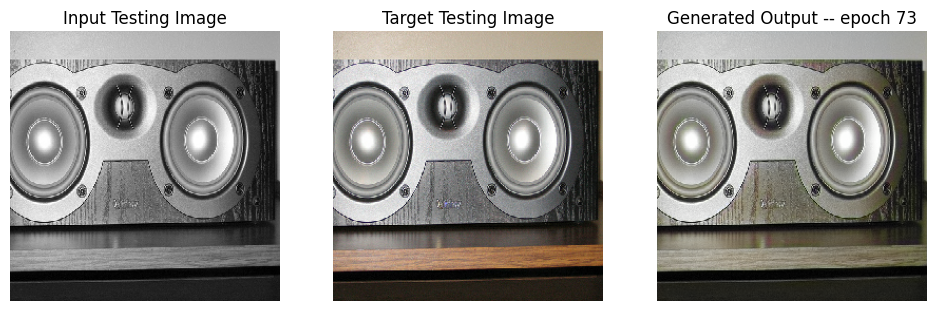

SSIM Score: 0.9526756405830383
PSNR Score: 28.310775756835938
Epoch 73
Training Details
Generator-- total_loss:7.36121 gan_loss:0.00000 l1_loss:0.04095 perceptual_loss:0.00812 Discriminator-- total_loss:162.82109 real_loss:162.82109 generated_loss:0.00000 --- SSIM 0.91876 PSNR 23.75152 LPIPS 0.00000
Time taken for epoch 74 is 532.5868599414825 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.13002 gan_loss:0.00000 l1_loss:0.04479  perceptual_loss:0.00941 Discriminator-- total_loss:126.90041 real_loss:126.90041 generated_loss:0.00000 --- SSIM 0.91634 PSNR 23.27254 LPIPS 0.00000
Time taken for epoch 74 is 572.7766590118408 sec
Number of iteration 63
Epoch 74
Training Details
Generator-- total_loss:7.42340 gan_loss:0.00000 l1_loss:0.04131 perceptual_loss:0.00818 Discriminator-- total_loss:163.39638 real_loss:163.39638 generated_loss:0.00000 --- SSIM 0.91783 PSNR 23.71544 LPIPS 0.00000
Time taken for epoch 75 is 531.2453804016113 sec
Number of iteration 500
Validatio

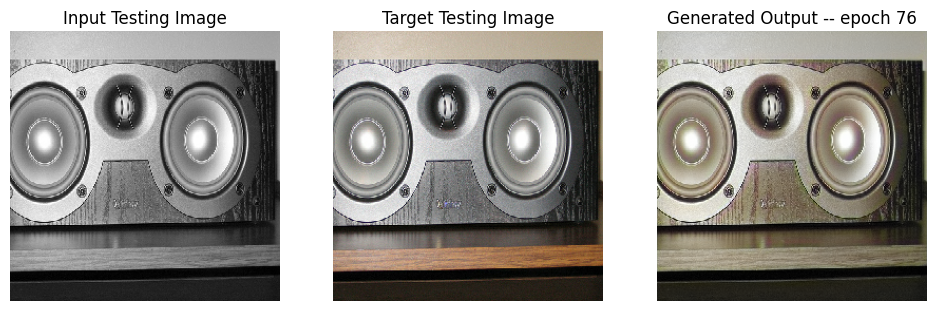

SSIM Score: 0.9488380551338196
PSNR Score: 27.006258010864258
Epoch 76
Training Details
Generator-- total_loss:7.31869 gan_loss:0.00000 l1_loss:0.04071 perceptual_loss:0.00808 Discriminator-- total_loss:164.14178 real_loss:164.14178 generated_loss:0.00000 --- SSIM 0.91874 PSNR 23.82798 LPIPS 0.00000
Time taken for epoch 77 is 533.3315424919128 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.24647 gan_loss:0.00000 l1_loss:0.04560  perceptual_loss:0.00938 Discriminator-- total_loss:125.18309 real_loss:125.18309 generated_loss:0.00000 --- SSIM 0.91502 PSNR 23.20241 LPIPS 0.00000
Time taken for epoch 77 is 573.9100635051727 sec
Number of iteration 63
Epoch 77
Training Details
Generator-- total_loss:7.30937 gan_loss:0.00000 l1_loss:0.04064 perceptual_loss:0.00809 Discriminator-- total_loss:163.94415 real_loss:163.94415 generated_loss:0.00000 --- SSIM 0.92017 PSNR 23.82653 LPIPS 0.00000
Time taken for epoch 78 is 534.5912961959839 sec
Number of iteration 500
Validatio

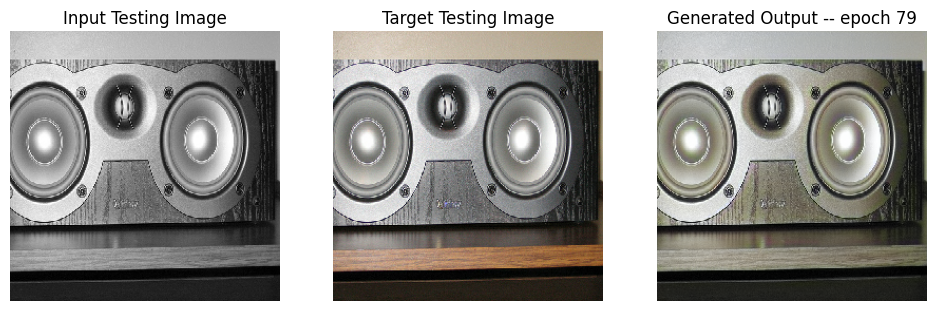

SSIM Score: 0.9508830904960632
PSNR Score: 27.639606475830078
Epoch 79
Training Details
Generator-- total_loss:7.29117 gan_loss:0.00000 l1_loss:0.04056 perceptual_loss:0.00805 Discriminator-- total_loss:164.66447 real_loss:164.66447 generated_loss:0.00000 --- SSIM 0.91986 PSNR 23.85113 LPIPS 0.00000
Time taken for epoch 80 is 533.3896484375 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.10711 gan_loss:0.00000 l1_loss:0.04451  perceptual_loss:0.00954 Discriminator-- total_loss:127.46500 real_loss:127.46500 generated_loss:0.00000 --- SSIM 0.91636 PSNR 23.41572 LPIPS 0.00000
Time taken for epoch 80 is 574.0765557289124 sec
Number of iteration 63


In [50]:
fit(train_dataset, epochs, val, gen)

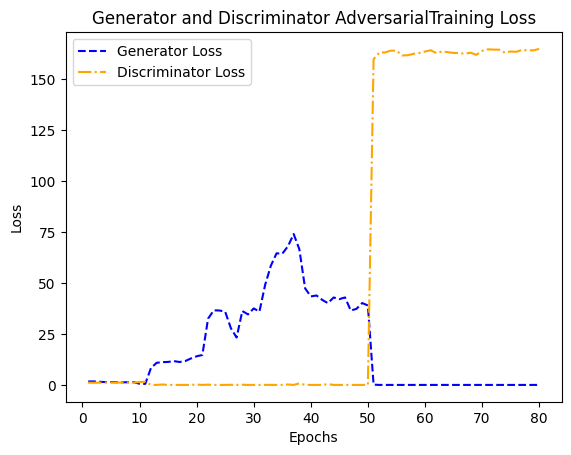

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

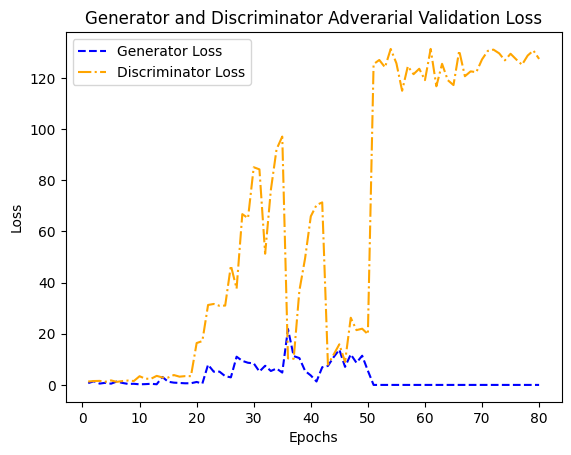

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

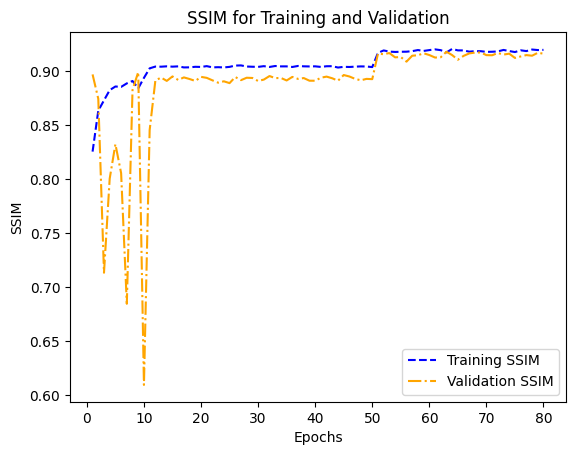

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

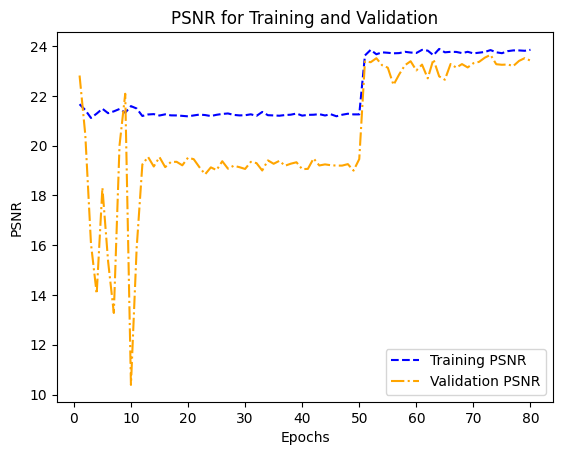

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

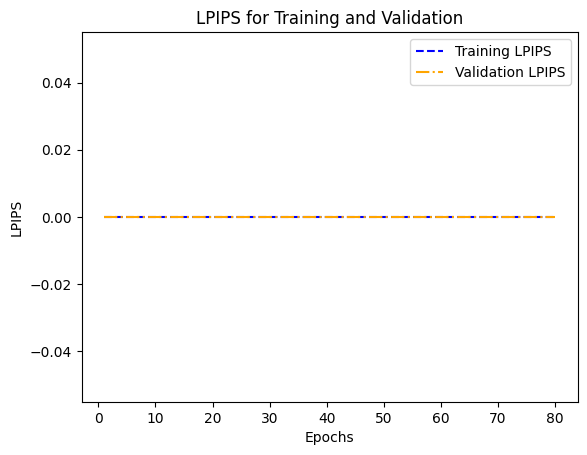

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

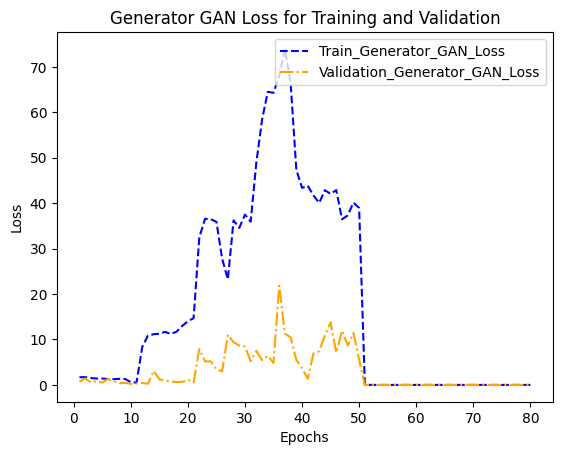

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

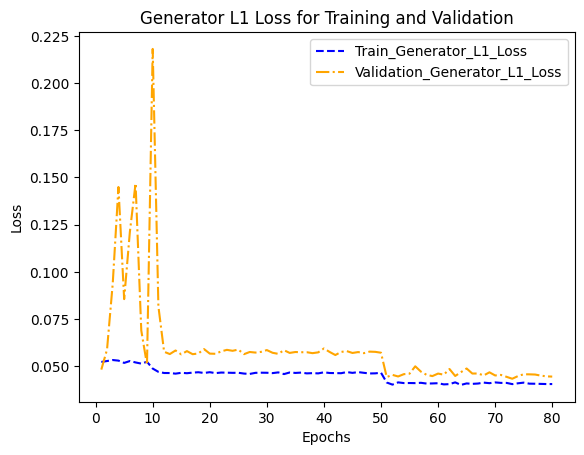

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

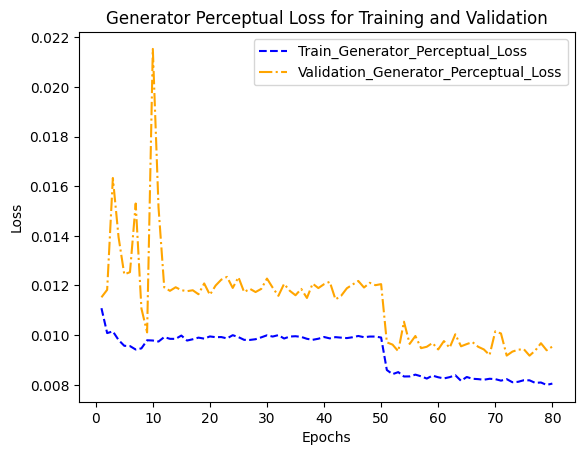

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

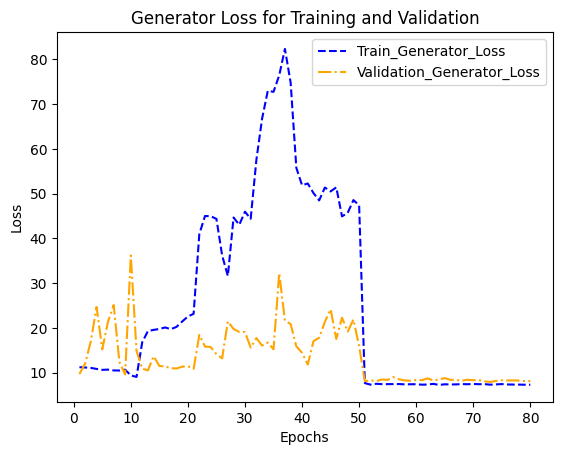

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

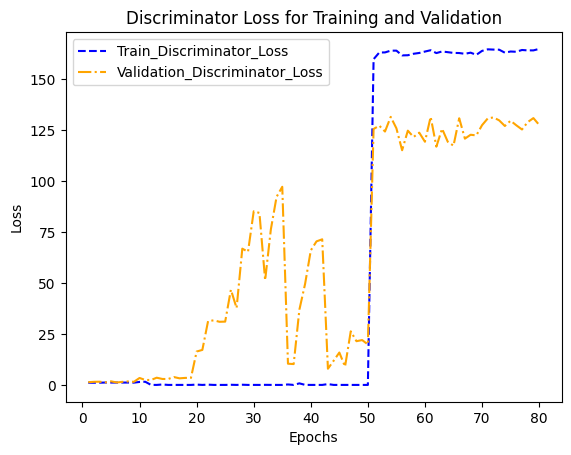

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

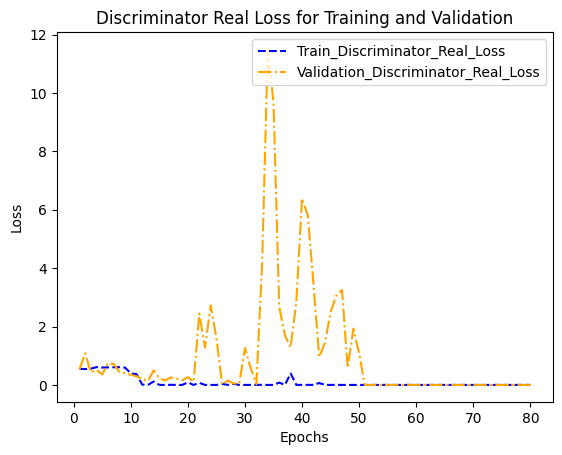

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

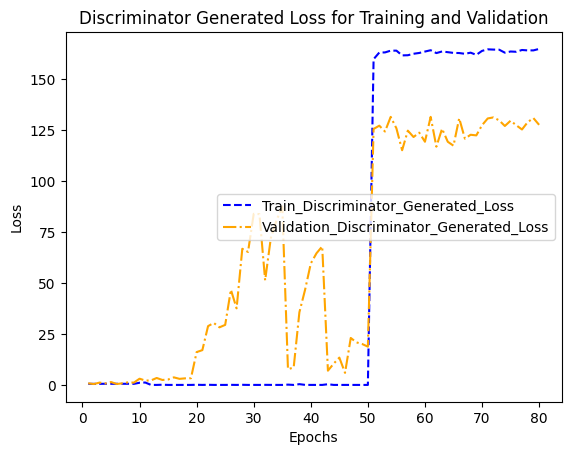

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip